In [2]:
!pip install qutip --quiet

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from qutip import *

In [4]:
N = 20  # (truncated Hilbert space)
a = destroy(N)  # (annihilation operator)

# Hamiltonian: H = ħω (a†a + 1/2)
H = a.dag() * a + 0.5

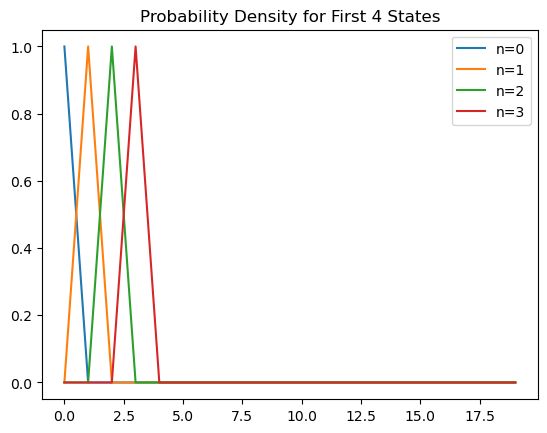

In [5]:
eigenstates = H.eigenstates()
energies = eigenstates[0]
states = eigenstates[1]

for n in range(4):
    x = np.linspace(-5, 5, 200)
    psi_x = basis(N, n).full().flatten()
    plt.plot(np.abs(psi_x)**2, label=f'n={n}')
plt.legend()
plt.title("Probability Density for First 4 States")
plt.show()

/opt/anaconda3/lib/python3.12/site-packages/qutip/solver/solver_base.py:576: FutureWarning: e_ops will be keyword only from qutip 5.3 for all solver
  warnings.warn(


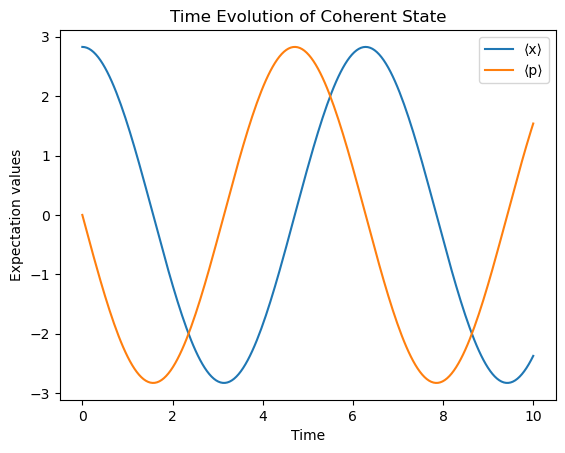

In [6]:
psi0 = coherent(N, 2.0)  # coherent state
tlist = np.linspace(0, 10, 200)
result = mesolve(H, psi0, tlist, [], [])

expect_x = expect(position(N), result.states)
expect_p = expect(momentum(N), result.states)

plt.plot(tlist, expect_x, label='⟨x⟩')
plt.plot(tlist, expect_p, label='⟨p⟩')
plt.legend()
plt.title("Time Evolution of Coherent State")
plt.xlabel("Time")
plt.ylabel("Expectation values")
plt.show()

In [7]:
from matplotlib import animation
from IPython.display import HTML

In [8]:
# Install QuTiP if not already installed
# !pip install qutip --quiet

import numpy as np
import matplotlib.pyplot as plt
from qutip import *
from matplotlib import animation
from IPython.display import HTML

# System settings
N = 20  # Hilbert space dimension (number of Fock states)
a = destroy(N)  # Annihilation operator
H = a.dag() * a + 0.5  # Harmonic oscillator Hamiltonian with ħω=1

# Initial state: coherent state |α⟩
psi0 = coherent(N, 2.0)

# Time points for evolution
tlist = np.linspace(0, 20, 300)

# Solve the time-dependent Schrödinger equation
result = mesolve(H, psi0, tlist, [], [])

# Compute expectation value of position ⟨x⟩ over time
x_op = position(N)
expect_x = expect(x_op, result.states)

# Set up the figure for animation
fig, ax = plt.subplots()
ax.set_xlim(0, max(tlist))
ax.set_ylim(-3, 3)
line, = ax.plot([], [], lw=2)
ax.set_xlabel("Time")
ax.set_ylabel("⟨x⟩")
ax.set_title("Time Evolution of ⟨x⟩ for a Coherent State")

x_data, y_data = [], []

# Initialization function for the animation
def init():
    line.set_data([], [])
    return line,

# Animation update function
def animate(i):
    x_data.append(tlist[i])
    y_data.append(expect_x[i])
    line.set_data(x_data, y_data)
    return line,

# Create the animation
ani = animation.FuncAnimation(
    fig, animate, frames=len(tlist), init_func=init, blit=True, interval=50
)

# Prevent static plot display
plt.close(fig)

# Display the animation inside the notebook
HTML(ani.to_jshtml())


In [ ]:
!pip install pillow

In [17]:
ani.save("qho_animation.gif", writer="pillow", fps=20)